In [1]:
#Ignore warnings
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
from plotly import tools, subplots
from matplotlib import rcParams

#NLTK libraries
import nltk
import re
import string\
from wordcloud import WordCloud,STOPWORDS
# from nltk.stem.porter import PorterStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import preprocessing
# from nltk.stem import WordNetLemmatizer
from collections import Counter
from imblearn.over_sampling import SMOTE
from collections import defaultdict

#Metrics libraries
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc

#Visualization libraries\=
import matplotlib.pyplot as plt 
from matplotlib import rcParams
import seaborn as sns
from textblob import TextBlob
from plotly import tools
import plotly.graph_objs as go
from plotly.offline import iplot
import plotly.express as px
%matplotlib inline

# importing machine learning libaries
import sklearn
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import BernoulliNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split

from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn import svm, datasets
from scipy import interp
from itertools import cycle

from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import GridSearchCV


In [2]:
data = pd.read_csv("amazon_reviews_Mobile_Electronics.csv")
print('Amazon Reviews for sentiment Analysis Dataset:')
data

Amazon Reviews for sentiment Analysis Dataset:


,marketplace,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,total_votes,vine,verified_purchase,review_headline,review_body,review_date
0,US,20422322,R8MEA6IGAHO0B,B00MC4CED8,217304173,BlackVue DR600GW-PMP,Mobile_Electronics,5.0,0.0,0.0,N,Y,Very Happy!,"As advertised. Everything works perfectly, I'm...",31/08/2015
1,US,40835037,R31LOQ8JGLPRLK,B00OQMFG1Q,137313254,GENSSI GSM / GPS Two Way Smart Phone Car Alarm...,Mobile_Electronics,5.0,0.0,1.0,N,Y,five star,it's great,31/08/2015
2,US,51469641,R2Y0MM9YE6OP3P,B00QERR5CY,82850235,iXCC Multi pack Lightning cable,Mobile_Electronics,5.0,0.0,0.0,N,Y,great cables,These work great and fit my life proof case fo...,31/08/2015
3,US,4332923,RRB9C05HDOD4O,B00QUFTPV4,221169481,abcGoodefg® FBI Covert Acoustic Tube Earpiece ...,Mobile_Electronics,4.0,0.0,0.0,N,Y,Work very well but couldn't get used to not he...,Work very well but couldn't get used to not he...,31/08/2015
4,US,44855305,R26I2RI1GFV8QG,B0067XVNTG,563475445,Generic Car Dashboard Video Camera Vehicle Vid...,Mobile_Electronics,2.0,0.0,0.0,N,Y,Cameras has battery issues,"Be careful with these products, I have bought ...",31/08/2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104970,US,38978459,R2CDRVDUKB5Z9P,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,23.0,27.0,N,N,The Cat Barf is Gone!,"I've been looking for a while for the \\""purr\...",03/04/2002
104971,US,51697602,R1DVLTZFXXOX9,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,10.0,11.0,N,N,Well worth [it],We live in an apartment with hardwood floors a...,05/03/2002
104972,US,50891675,R1GHKKZMHAHQC1,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,13.0,13.0,N,N,Its a Time saver!!!,I received this for a birthday present and Its...,19/02/2002
104973,US,38528439,R227G6T5B26DVC,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,58.0,61.0,N,N,Got Stains?,I got the Dirt Devil Spot Scrubber for a gift ...,06/01/2002


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 104975 entries, 0 to 104974
Data columns (total 15 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   marketplace        104975 non-null  object 
 1   customer_id        104975 non-null  int64  
 2   review_id          104975 non-null  object 
 3   product_id         104975 non-null  object 
 4   product_parent     104975 non-null  int64  
 5   product_title      104975 non-null  object 
 6   product_category   104963 non-null  object 
 7   star_rating        104963 non-null  float64
 8   helpful_votes      104963 non-null  float64
 9   total_votes        104963 non-null  float64
 10  vine               104963 non-null  object 
 11  verified_purchase  104963 non-null  object 
 12  review_headline    104961 non-null  object 
 13  review_body        104960 non-null  object 
 14  review_date        104961 non-null  object 
dtypes: float64(3), int64(2), object(10)
memory usage: 1

In [4]:
data.isnull().sum()

marketplace           0
customer_id           0
review_id             0
product_id            0
product_parent        0
product_title         0
product_category     12
star_rating          12
helpful_votes        12
total_votes          12
vine                 12
verified_purchase    12
review_headline      14
review_body          15
review_date          14
dtype: int64

In [5]:
duplicates = data[data.duplicated()]
print("Duplicate rows:")
print(duplicates)


Duplicate rows:
Empty DataFrame
Columns: [marketplace, customer_id, review_id, product_id, product_parent, product_title, product_category, star_rating, helpful_votes, total_votes, vine, verified_purchase, review_headline, review_body, review_date]
Index: []


In [6]:
# deleting rows with missing values and NaN
data.dropna(inplace = True)
# deleting columns that are not relevant
data.drop(columns=['total_votes', 'vine'], inplace=True)
data


,marketplace,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,verified_purchase,review_headline,review_body,review_date
0,US,20422322,R8MEA6IGAHO0B,B00MC4CED8,217304173,BlackVue DR600GW-PMP,Mobile_Electronics,5.0,0.0,Y,Very Happy!,"As advertised. Everything works perfectly, I'm...",31/08/2015
1,US,40835037,R31LOQ8JGLPRLK,B00OQMFG1Q,137313254,GENSSI GSM / GPS Two Way Smart Phone Car Alarm...,Mobile_Electronics,5.0,0.0,Y,five star,it's great,31/08/2015
2,US,51469641,R2Y0MM9YE6OP3P,B00QERR5CY,82850235,iXCC Multi pack Lightning cable,Mobile_Electronics,5.0,0.0,Y,great cables,These work great and fit my life proof case fo...,31/08/2015
3,US,4332923,RRB9C05HDOD4O,B00QUFTPV4,221169481,abcGoodefg® FBI Covert Acoustic Tube Earpiece ...,Mobile_Electronics,4.0,0.0,Y,Work very well but couldn't get used to not he...,Work very well but couldn't get used to not he...,31/08/2015
4,US,44855305,R26I2RI1GFV8QG,B0067XVNTG,563475445,Generic Car Dashboard Video Camera Vehicle Vid...,Mobile_Electronics,2.0,0.0,Y,Cameras has battery issues,"Be careful with these products, I have bought ...",31/08/2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...
104970,US,38978459,R2CDRVDUKB5Z9P,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,23.0,N,The Cat Barf is Gone!,"I've been looking for a while for the \\""purr\...",03/04/2002
104971,US,51697602,R1DVLTZFXXOX9,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,10.0,N,Well worth [it],We live in an apartment with hardwood floors a...,05/03/2002
104972,US,50891675,R1GHKKZMHAHQC1,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,13.0,N,Its a Time saver!!!,I received this for a birthday present and Its...,19/02/2002
104973,US,38528439,R227G6T5B26DVC,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,58.0,N,Got Stains?,I got the Dirt Devil Spot Scrubber for a gift ...,06/01/2002


In [7]:
data.isnull().sum()

marketplace          0
customer_id          0
review_id            0
product_id           0
product_parent       0
product_title        0
product_category     0
star_rating          0
helpful_votes        0
verified_purchase    0
review_headline      0
review_body          0
review_date          0
dtype: int64

In [8]:
print('The distribution of categories of sentiment:') 
data['star_rating'].value_counts()

The distribution of categories of sentiment:


5.0    52247
4.0    18086
1.0    17584
3.0     9731
2.0     7310
Name: star_rating, dtype: int64

In [9]:
# join review_healine and review_body together in a review column
data['reviews'] = data['review_headline'] + data['review_body']
data = data.drop(['review_headline', 'review_body'], axis=1)
data

,marketplace,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,verified_purchase,review_date,reviews
0,US,20422322,R8MEA6IGAHO0B,B00MC4CED8,217304173,BlackVue DR600GW-PMP,Mobile_Electronics,5.0,0.0,Y,31/08/2015,Very Happy!As advertised. Everything works per...
1,US,40835037,R31LOQ8JGLPRLK,B00OQMFG1Q,137313254,GENSSI GSM / GPS Two Way Smart Phone Car Alarm...,Mobile_Electronics,5.0,0.0,Y,31/08/2015,five starit's great
2,US,51469641,R2Y0MM9YE6OP3P,B00QERR5CY,82850235,iXCC Multi pack Lightning cable,Mobile_Electronics,5.0,0.0,Y,31/08/2015,great cablesThese work great and fit my life p...
3,US,4332923,RRB9C05HDOD4O,B00QUFTPV4,221169481,abcGoodefg® FBI Covert Acoustic Tube Earpiece ...,Mobile_Electronics,4.0,0.0,Y,31/08/2015,Work very well but couldn't get used to not he...
4,US,44855305,R26I2RI1GFV8QG,B0067XVNTG,563475445,Generic Car Dashboard Video Camera Vehicle Vid...,Mobile_Electronics,2.0,0.0,Y,31/08/2015,Cameras has battery issuesBe careful with thes...
...,...,...,...,...,...,...,...,...,...,...,...,...
104970,US,38978459,R2CDRVDUKB5Z9P,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,23.0,N,03/04/2002,The Cat Barf is Gone!I've been looking for a w...
104971,US,51697602,R1DVLTZFXXOX9,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,10.0,N,05/03/2002,Well worth [it]We live in an apartment with ha...
104972,US,50891675,R1GHKKZMHAHQC1,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,13.0,N,19/02/2002,Its a Time saver!!!I received this for a birth...
104973,US,38528439,R227G6T5B26DVC,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,58.0,N,06/01/2002,Got Stains?I got the Dirt Devil Spot Scrubber ...


# Creating a Sentiment Column in our dataset as label.

In [10]:

# creating sentiment_rating column
def sentiment(rating):
    if rating['star_rating'] == 3:
        value = 'Neutral'
    elif rating['star_rating'] > 3:
        value = 'Positive'
    else:
        value = 'Negative'
    return value

#Applying the function in our new column
data['sentiment'] = data.apply(sentiment, axis=1)
data.head()

,marketplace,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,verified_purchase,review_date,reviews,sentiment
0,US,20422322,R8MEA6IGAHO0B,B00MC4CED8,217304173,BlackVue DR600GW-PMP,Mobile_Electronics,5.0,0.0,Y,31/08/2015,Very Happy!As advertised. Everything works per...,Positive
1,US,40835037,R31LOQ8JGLPRLK,B00OQMFG1Q,137313254,GENSSI GSM / GPS Two Way Smart Phone Car Alarm...,Mobile_Electronics,5.0,0.0,Y,31/08/2015,five starit's great,Positive
2,US,51469641,R2Y0MM9YE6OP3P,B00QERR5CY,82850235,iXCC Multi pack Lightning cable,Mobile_Electronics,5.0,0.0,Y,31/08/2015,great cablesThese work great and fit my life p...,Positive
3,US,4332923,RRB9C05HDOD4O,B00QUFTPV4,221169481,abcGoodefg® FBI Covert Acoustic Tube Earpiece ...,Mobile_Electronics,4.0,0.0,Y,31/08/2015,Work very well but couldn't get used to not he...,Positive
4,US,44855305,R26I2RI1GFV8QG,B0067XVNTG,563475445,Generic Car Dashboard Video Camera Vehicle Vid...,Mobile_Electronics,2.0,0.0,Y,31/08/2015,Cameras has battery issuesBe careful with thes...,Negative


In [11]:
data['sentiment'].value_counts()


Positive    70333
Negative    24894
Neutral      9731
Name: sentiment, dtype: int64

In [12]:
# Split the date column into day, month, and year
date_split = data['review_date'].str.split('/', expand=True)

# Rename the split columns
date_split.columns = ['day', 'month', 'year']

# Concatenate the split columns with the original DataFrame
data = pd.concat([data, date_split], axis=1)

# delete the review_date column and Print the modified DataFrame
data = data.drop(['review_date'], axis=1)
data

,marketplace,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,verified_purchase,reviews,sentiment,day,month,year
0,US,20422322,R8MEA6IGAHO0B,B00MC4CED8,217304173,BlackVue DR600GW-PMP,Mobile_Electronics,5.0,0.0,Y,Very Happy!As advertised. Everything works per...,Positive,31,08,2015
1,US,40835037,R31LOQ8JGLPRLK,B00OQMFG1Q,137313254,GENSSI GSM / GPS Two Way Smart Phone Car Alarm...,Mobile_Electronics,5.0,0.0,Y,five starit's great,Positive,31,08,2015
2,US,51469641,R2Y0MM9YE6OP3P,B00QERR5CY,82850235,iXCC Multi pack Lightning cable,Mobile_Electronics,5.0,0.0,Y,great cablesThese work great and fit my life p...,Positive,31,08,2015
3,US,4332923,RRB9C05HDOD4O,B00QUFTPV4,221169481,abcGoodefg® FBI Covert Acoustic Tube Earpiece ...,Mobile_Electronics,4.0,0.0,Y,Work very well but couldn't get used to not he...,Positive,31,08,2015
4,US,44855305,R26I2RI1GFV8QG,B0067XVNTG,563475445,Generic Car Dashboard Video Camera Vehicle Vid...,Mobile_Electronics,2.0,0.0,Y,Cameras has battery issuesBe careful with thes...,Negative,31,08,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104970,US,38978459,R2CDRVDUKB5Z9P,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,23.0,N,The Cat Barf is Gone!I've been looking for a w...,Positive,03,04,2002
104971,US,51697602,R1DVLTZFXXOX9,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,10.0,N,Well worth [it]We live in an apartment with ha...,Positive,05,03,2002
104972,US,50891675,R1GHKKZMHAHQC1,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,13.0,N,Its a Time saver!!!I received this for a birth...,Positive,19,02,2002
104973,US,38528439,R227G6T5B26DVC,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,58.0,N,Got Stains?I got the Dirt Devil Spot Scrubber ...,Positive,06,01,2002


In [13]:
print('The year count of reviews:')
data['year'].value_counts()

The year count of reviews:


2013    24383
2014    21979
2015    17274
2012    15465
2011    11940
2010     6973
2009     2943
2008     1750
2007     1379
2006      443
2005      224
2004      115
2003       61
2002       28
2001        1
Name: year, dtype: int64

In [14]:
print('Year count of sentiments:')
data.groupby(['year','sentiment'])['sentiment'].count()

Year count of sentiments:


year  sentiment
2001  Positive         1
2002  Negative        10
      Neutral          3
      Positive        15
2003  Negative        38
      Neutral          8
      Positive        15
2004  Negative        28
      Neutral          7
      Positive        80
2005  Negative        78
      Neutral         27
      Positive       119
2006  Negative       141
      Neutral         43
      Positive       259
2007  Negative       347
      Neutral        160
      Positive       872
2008  Negative       438
      Neutral        157
      Positive      1155
2009  Negative       734
      Neutral        261
      Positive      1948
2010  Negative      1665
      Neutral        731
      Positive      4577
2011  Negative      2875
      Neutral       1150
      Positive      7915
2012  Negative      3845
      Neutral       1393
      Positive     10227
2013  Negative      5221
      Neutral       2396
      Positive     16766
2014  Negative      5376
      Neutral       1991
      Pos

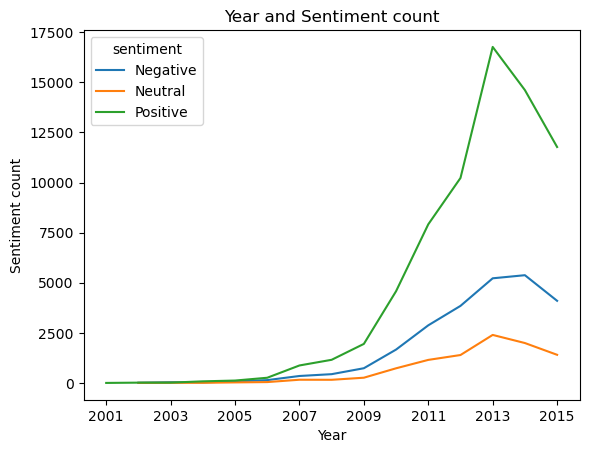

In [15]:
data.groupby(['year','sentiment'])['sentiment'].count().unstack().plot(legend=True)
plt.title('Year and Sentiment count')
plt.xlabel('Year')
plt.ylabel('Sentiment count')
plt.show()

In [77]:
helpfullness = data.groupby(['sentiment'])['helpful_votes'].sum().reset_index()
print('\nHelpfullness of votes and star rating:\n ', helpfullness)


Helpfullness of votes and star rating:
     sentiment  helpful_votes
0          0        34083.0
1          1        11604.0
2          2        84930.0


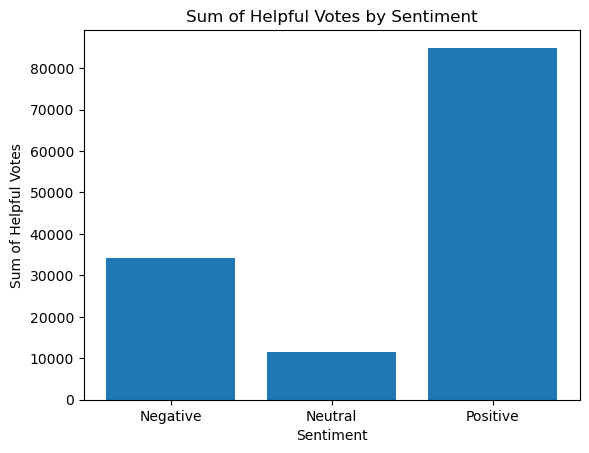

In [19]:
# Plotting
plt.bar(helpfullness['sentiment'], helpfullness['helpful_votes'])
plt.xlabel('Sentiment')
plt.ylabel('Sum of Helpful Votes')
plt.title('Sum of Helpful Votes by Sentiment')
plt.show()


In [21]:
# data.groupby(['year','helpful_votes']).size()
groupby_year = data.groupby(['year'])['helpful_votes'].sum().reset_index()
print(groupby_year)

    year  helpful_votes
0   2001           37.0
1   2002          330.0
2   2003          214.0
3   2004          991.0
4   2005         1495.0
5   2006         2910.0
6   2007         4102.0
7   2008         4750.0
8   2009        10811.0
9   2010        15295.0
10  2011        20865.0
11  2012        20882.0
12  2013        22280.0
13  2014        16646.0
14  2015         9009.0


In [22]:
groupby_year_sum = data.groupby(['year', 'sentiment'])['helpful_votes'].sum().reset_index()
print(groupby_year_sum)

    year sentiment  helpful_votes
0   2001  Positive           37.0
1   2002  Negative           62.0
2   2002   Neutral           10.0
3   2002  Positive          258.0
4   2003  Negative          136.0
5   2003   Neutral           17.0
6   2003  Positive           61.0
7   2004  Negative          120.0
8   2004   Neutral           89.0
9   2004  Positive          782.0
10  2005  Negative          443.0
11  2005   Neutral          122.0
12  2005  Positive          930.0
13  2006  Negative         1108.0
14  2006   Neutral          172.0
15  2006  Positive         1630.0
16  2007  Negative         1218.0
17  2007   Neutral          452.0
18  2007  Positive         2432.0
19  2008  Negative         1064.0
20  2008   Neutral          339.0
21  2008  Positive         3347.0
22  2009  Negative         3738.0
23  2009   Neutral         1105.0
24  2009  Positive         5968.0
25  2010  Negative         3872.0
26  2010   Neutral         1413.0
27  2010  Positive        10010.0
28  2011  Nega

In [25]:
def clean_review(text):
    '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
    and remove words containing numbers.'''
    text = str(text).lower()
    text = re.sub('\[.*?\]', ',', text)
    text = re.sub('https?://\S+|www\.\><br\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    return text

data['reviews'] = data['reviews'].apply(lambda x: clean_review(x))
data.head()

,marketplace,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,verified_purchase,reviews,sentiment,day,month,year
0,US,20422322,R8MEA6IGAHO0B,B00MC4CED8,217304173,BlackVue DR600GW-PMP,Mobile_Electronics,5.0,0.0,Y,very happyas advertised everything works perfe...,Positive,31,08,2015
1,US,40835037,R31LOQ8JGLPRLK,B00OQMFG1Q,137313254,GENSSI GSM / GPS Two Way Smart Phone Car Alarm...,Mobile_Electronics,5.0,0.0,Y,five starits great,Positive,31,08,2015
2,US,51469641,R2Y0MM9YE6OP3P,B00QERR5CY,82850235,iXCC Multi pack Lightning cable,Mobile_Electronics,5.0,0.0,Y,great cablesthese work great and fit my life p...,Positive,31,08,2015
3,US,4332923,RRB9C05HDOD4O,B00QUFTPV4,221169481,abcGoodefg® FBI Covert Acoustic Tube Earpiece ...,Mobile_Electronics,4.0,0.0,Y,work very well but couldnt get used to not hea...,Positive,31,08,2015
4,US,44855305,R26I2RI1GFV8QG,B0067XVNTG,563475445,Generic Car Dashboard Video Camera Vehicle Vid...,Mobile_Electronics,2.0,0.0,Y,cameras has battery issuesbe careful with thes...,Negative,31,08,2015


In [26]:
stop_words= ['yourselves', ',', 'between', 'whom', 'itself', 'is', "she's", 'up', 'herself', 'here', 'your', 'each',
             'we', 'he', 'my', "you've", 'having', 'in', 'both', 'for', 'themselves', 'are', 'them', 'other',
             'and', 'an', 'during', 'their', 'can', 'yourself', 'she', 'until', 'so', 'these', 'ours', 'above',
             'what', 'while', 'have', 're', 'more', 'only', "needn't", 'when', 'just', 'that', 'were', "don't",
             'very', 'should', 'any', 'y', 'isn', 'who',  'a', 'they', 'to', 'too', "should've", 'has', 'before',
             'into', 'yours', "it's", 'do', 'against', 'on',  'now', 'her', 've', 'd', 'by', 'am', 'from',
             'about', 'further', "that'll", "you'd", 'you', 'as', 'how', 'been', 'the', 'or', 'doing', 'such',
             'his', 'himself', 'ourselves',  'was', 'through', 'out', 'below', 'own', 'myself', 'theirs',
             'me', 'why', 'once',  'him', 'than', 'be', 'most', "you'll", 'same', 'some', 'with', 'few', 'it',
             'at', 'after', 'its', 'which', 'there','our', 'this', 'hers', 'being', 'did', 'of', 'had', 'under',
             'over','again', 'where', 'those', 'then', "you're", 'i', 'because', 'does', 'all']

In [27]:
data['reviews'] = data['reviews'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
data.head()

,marketplace,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,verified_purchase,reviews,sentiment,day,month,year
0,US,20422322,R8MEA6IGAHO0B,B00MC4CED8,217304173,BlackVue DR600GW-PMP,Mobile_Electronics,5.0,0.0,Y,happyas advertised everything works perfectly ...,Positive,31,08,2015
1,US,40835037,R31LOQ8JGLPRLK,B00OQMFG1Q,137313254,GENSSI GSM / GPS Two Way Smart Phone Car Alarm...,Mobile_Electronics,5.0,0.0,Y,five starits great,Positive,31,08,2015
2,US,51469641,R2Y0MM9YE6OP3P,B00QERR5CY,82850235,iXCC Multi pack Lightning cable,Mobile_Electronics,5.0,0.0,Y,great cablesthese work great fit life proof ca...,Positive,31,08,2015
3,US,4332923,RRB9C05HDOD4O,B00QUFTPV4,221169481,abcGoodefg® FBI Covert Acoustic Tube Earpiece ...,Mobile_Electronics,4.0,0.0,Y,work well but couldnt get used not hearing wor...,Positive,31,08,2015
4,US,44855305,R26I2RI1GFV8QG,B0067XVNTG,563475445,Generic Car Dashboard Video Camera Vehicle Vid...,Mobile_Electronics,2.0,0.0,Y,cameras battery issuesbe careful products boug...,Negative,31,08,2015


In [28]:
pd.DataFrame(data.groupby('sentiment')['helpful_votes'].mean())

,helpful_votes
sentiment,
Negative,1.369125
Neutral,1.192478
Positive,1.207541


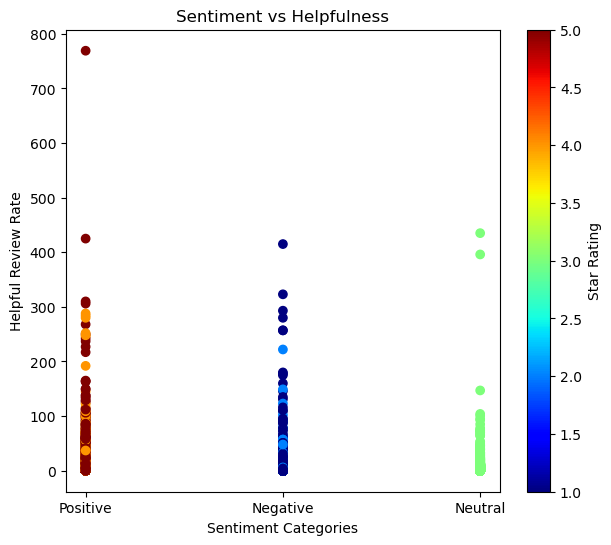

In [29]:
#plot layout
f = plt.figure(figsize=(7,6))
ax = f.gca() # instead of plt.gca()
dots = ax.scatter(data['sentiment'], data['helpful_votes'], 
                  c=data['star_rating'],  # the 'c' parameter specifies the feature to use for coloring
           cmap='jet')                     # the cmap parameter specifies the colormap
# adding colorbar
plt.colorbar(dots, label='Star Rating')

plt.title('Sentiment vs Helpfulness')
plt.xlabel('Sentiment Categories')
plt.ylabel('Helpful Review Rate')
plt.show()


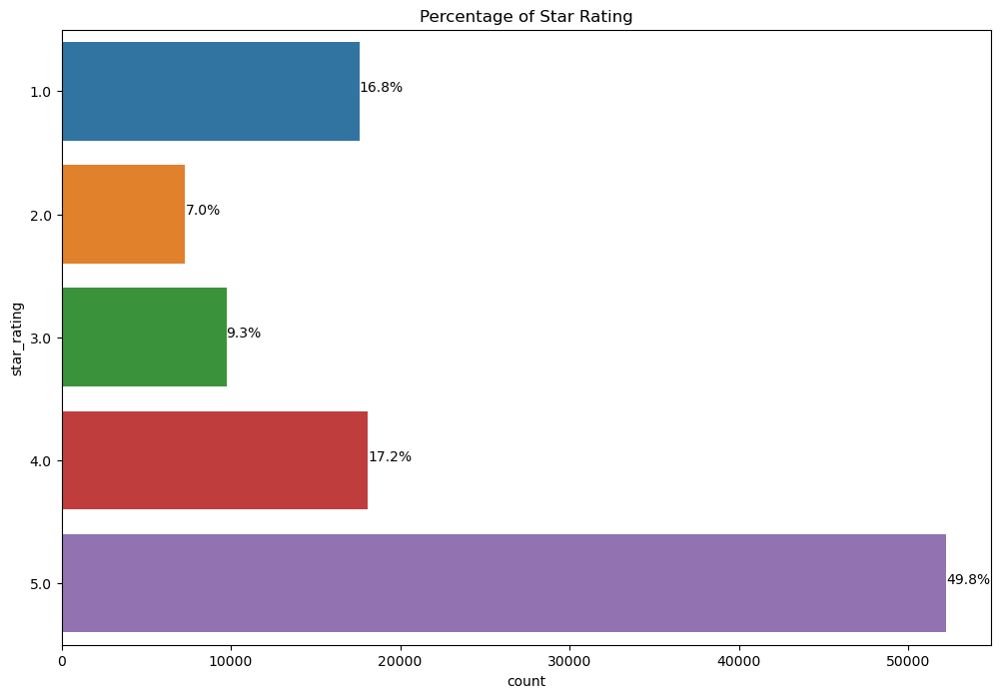

In [30]:
# Percentage of star rating
plt.figure(figsize=(12,8))
plt.title('Percentage of Star Rating')
ax = sns.countplot(y = 'star_rating', data = data)
total = len(data)
for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

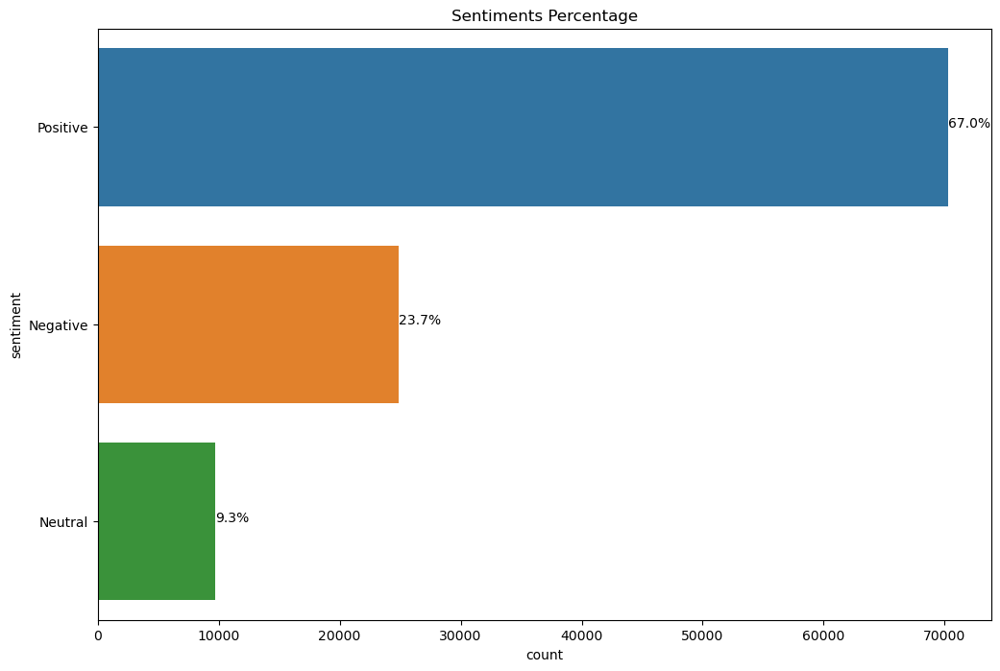

In [31]:
# Percentage of Sentiments
plt.figure(figsize=(12,8))
plt.title('Sentiments Percentage')
ax = sns.countplot(y = 'sentiment', data = data)
total = len(data)
for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

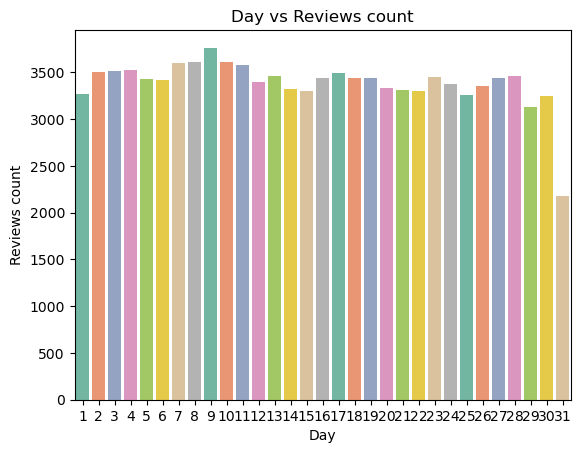

In [32]:
dayreview = pd.DataFrame(data.groupby('day')['reviews'].count()).reset_index()
dayreview['day'] = dayreview['day'].astype('int64')
dayreview.sort_values(by=['day'])

# Selecting a color palette
custom_palette = sns.color_palette("Set2")

# Plotting the graph with the custom color palette
sns.barplot(data=dayreview, x="day", y="reviews", palette=custom_palette)
plt.title('Day vs Reviews count')
plt.xlabel('Day')
plt.ylabel('Reviews count')
plt.show()

In [33]:
# viewing the structure of th reviews
review_features = data.copy()
review_features = review_features[['reviews']].reset_index(drop=True)
review_features


,reviews
0,happyas advertised everything works perfectly ...
1,five starits great
2,great cablesthese work great fit life proof ca...
3,work well but couldnt get used not hearing wor...
4,cameras battery issuesbe careful products boug...
...,...
104953,cat barf goneive looking purrfect solution cle...
104954,well worth live apartment hardwood floors carp...
104955,time saveri received birthday present best dog...
104956,got stainsi got dirt devil spot scrubber gift ...


In [34]:
# module to transform a collection of text reviews into a TF-IDF feature matrix.

tfidf_vectorizer = TfidfVectorizer(max_features = 10000, ngram_range = (2,2))
# TF-IDF feature matrix
X = tfidf_vectorizer.fit_transform(review_features['reviews'])
X.shape 

(104958, 10000)

In [35]:
y = data['sentiment']
y.shape

(104958,)

In [36]:
 pip install imbalanced-learn

Note: you may need to restart the kernel to use updated packages.


In [37]:
pip install textblob

Note: you may need to restart the kernel to use updated packages.


In [38]:
from textblob import TextBlob

In [39]:
data['polarity'] = data['reviews'].map(lambda text: TextBlob(text).sentiment.polarity)
data['review_len'] = data['reviews'].astype(str).apply(len)
data['word_count'] = data['reviews'].apply(lambda x: len(str(x).split()))
data


,marketplace,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,verified_purchase,reviews,sentiment,day,month,year,polarity,review_len,word_count
0,US,20422322,R8MEA6IGAHO0B,B00MC4CED8,217304173,BlackVue DR600GW-PMP,Mobile_Electronics,5.0,0.0,Y,happyas advertised everything works perfectly ...,Positive,31,08,2015,0.800000,102,16
1,US,40835037,R31LOQ8JGLPRLK,B00OQMFG1Q,137313254,GENSSI GSM / GPS Two Way Smart Phone Car Alarm...,Mobile_Electronics,5.0,0.0,Y,five starits great,Positive,31,08,2015,0.800000,18,3
2,US,51469641,R2Y0MM9YE6OP3P,B00QERR5CY,82850235,iXCC Multi pack Lightning cable,Mobile_Electronics,5.0,0.0,Y,great cablesthese work great fit life proof ca...,Positive,31,08,2015,0.666667,55,9
3,US,4332923,RRB9C05HDOD4O,B00QUFTPV4,221169481,abcGoodefg® FBI Covert Acoustic Tube Earpiece ...,Mobile_Electronics,4.0,0.0,Y,work well but couldnt get used not hearing wor...,Positive,31,08,2015,0.000000,108,20
4,US,44855305,R26I2RI1GFV8QG,B0067XVNTG,563475445,Generic Car Dashboard Video Camera Vehicle Vid...,Mobile_Electronics,2.0,0.0,Y,cameras battery issuesbe careful products boug...,Negative,31,08,2015,0.079167,115,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104970,US,38978459,R2CDRVDUKB5Z9P,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,23.0,N,cat barf goneive looking purrfect solution cle...,Positive,03,04,2002,0.080122,1788,258
104971,US,51697602,R1DVLTZFXXOX9,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,10.0,N,well worth live apartment hardwood floors carp...,Positive,05,03,2002,0.185939,270,42
104972,US,50891675,R1GHKKZMHAHQC1,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,13.0,N,time saveri received birthday present best dog...,Positive,19,02,2002,0.255000,365,56
104973,US,38528439,R227G6T5B26DVC,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,58.0,N,got stainsi got dirt devil spot scrubber gift ...,Positive,06,01,2002,0.142323,1057,169


# Sentiment PolarityDistribution

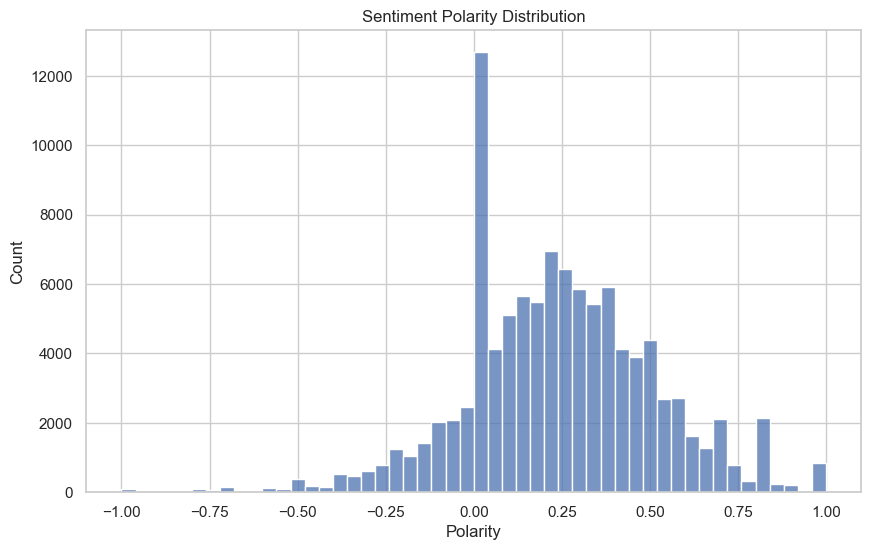

In [40]:
# Set the style of the plot
sns.set(style='whitegrid')

# Create a histogram using Seaborn
plt.figure(figsize=(10, 6))
sns.histplot(data=data, x='polarity', bins=50, kde=False)

# Set labels and title
plt.xlabel('Polarity')
plt.ylabel('Count')
plt.title('Sentiment Polarity Distribution')

# Show the plot
plt.show()

# Review Text Length Distribution

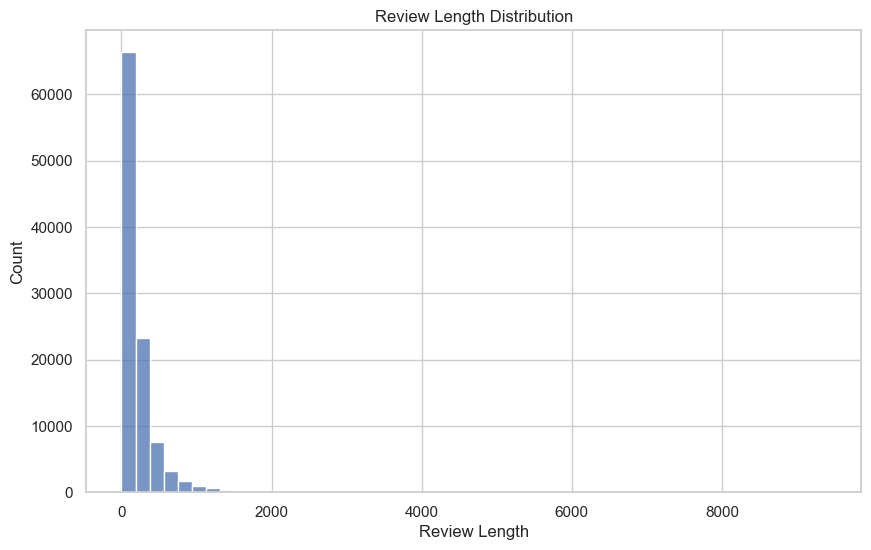

In [41]:
sns.set(style='whitegrid')
plt.figure(figsize=(10, 6))
sns.histplot(data=data, x='review_len', bins=50, kde=False)

plt.xlabel('Review Length')
plt.ylabel('Count')
plt.title('Review Length Distribution')

# Show the plot
plt.show()

# Review Text Word Count Distribution

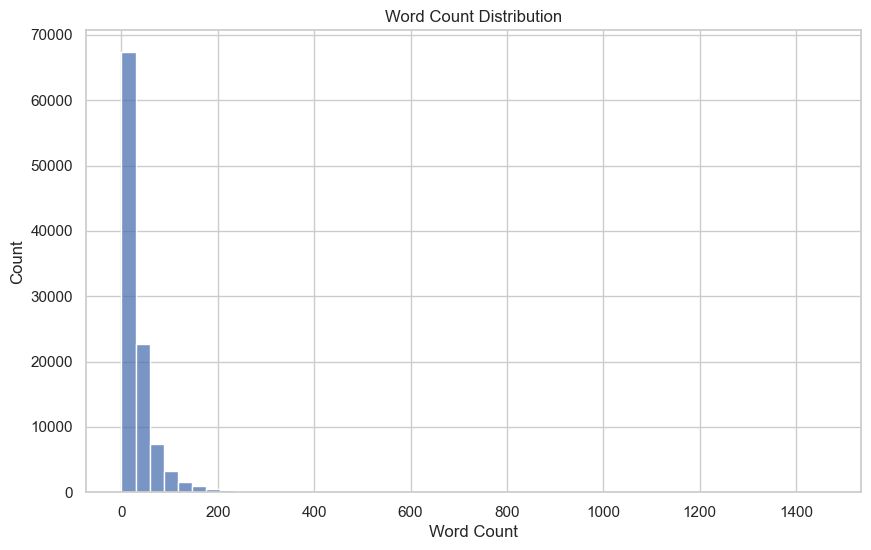

In [42]:
sns.set(style='whitegrid')
plt.figure(figsize=(10, 6))
sns.histplot(data=data, x='word_count', bins=50, kde=False)
plt.xlabel('Word Count')
plt.ylabel('Count')
plt.title('Word Count Distribution')
plt.show()

In [43]:
#Filtering data
positive_review = data[data["sentiment"]=='Positive']
neutral_review = data[data["sentiment"]=='Neutral']
negative_review = data[data["sentiment"]=='Negative']

## custom function for ngram generation ##
def generate_ngrams(text, n_gram = 1):
    token = [token for token in text.lower().split(" ") if token != "" if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [" ".join(ngram) for ngram in ngrams]

In [44]:
positive_review

,marketplace,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,verified_purchase,reviews,sentiment,day,month,year,polarity,review_len,word_count
0,US,20422322,R8MEA6IGAHO0B,B00MC4CED8,217304173,BlackVue DR600GW-PMP,Mobile_Electronics,5.0,0.0,Y,happyas advertised everything works perfectly ...,Positive,31,08,2015,0.800000,102,16
1,US,40835037,R31LOQ8JGLPRLK,B00OQMFG1Q,137313254,GENSSI GSM / GPS Two Way Smart Phone Car Alarm...,Mobile_Electronics,5.0,0.0,Y,five starits great,Positive,31,08,2015,0.800000,18,3
2,US,51469641,R2Y0MM9YE6OP3P,B00QERR5CY,82850235,iXCC Multi pack Lightning cable,Mobile_Electronics,5.0,0.0,Y,great cablesthese work great fit life proof ca...,Positive,31,08,2015,0.666667,55,9
3,US,4332923,RRB9C05HDOD4O,B00QUFTPV4,221169481,abcGoodefg® FBI Covert Acoustic Tube Earpiece ...,Mobile_Electronics,4.0,0.0,Y,work well but couldnt get used not hearing wor...,Positive,31,08,2015,0.000000,108,20
7,US,28902968,R3RRXU2R23NMQ9,B00ET5AWBY,508373185,iPad Car Headrest Mount Holder for iPad 2/ iPa...,Mobile_Electronics,5.0,0.0,Y,five starsworked great vacation,Positive,31,08,2015,0.800000,31,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104970,US,38978459,R2CDRVDUKB5Z9P,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,23.0,N,cat barf goneive looking purrfect solution cle...,Positive,03,04,2002,0.080122,1788,258
104971,US,51697602,R1DVLTZFXXOX9,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,10.0,N,well worth live apartment hardwood floors carp...,Positive,05,03,2002,0.185939,270,42
104972,US,50891675,R1GHKKZMHAHQC1,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,13.0,N,time saveri received birthday present best dog...,Positive,19,02,2002,0.255000,365,56
104973,US,38528439,R227G6T5B26DVC,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,5.0,58.0,N,got stainsi got dirt devil spot scrubber gift ...,Positive,06,01,2002,0.142323,1057,169


In [45]:
negative_review


,marketplace,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,verified_purchase,reviews,sentiment,day,month,year,polarity,review_len,word_count
4,US,44855305,R26I2RI1GFV8QG,B0067XVNTG,563475445,Generic Car Dashboard Video Camera Vehicle Vid...,Mobile_Electronics,2.0,0.0,Y,cameras battery issuesbe careful products boug...,Negative,31,08,2015,0.079167,115,16
13,US,4158732,R34EZZ68VYPHO0,B011Q291PK,891142775,IcePACK 8 Can Insulated Cooler Speaker System ...,Mobile_Electronics,1.0,1.0,Y,one starsucks,Negative,31,08,2015,0.000000,13,2
14,US,18944032,R3TZNSOXS13SIG,B00W6OLUGQ,577462547,DTK® AMI MDI MMI Adapter 8-PIN Lightning Cable...,Mobile_Electronics,2.0,1.0,Y,two starsu need plug,Negative,31,08,2015,0.000000,20,4
16,US,10947966,R5KCRE927NYMU,B00KW3XNUE,219920841,Magicfly Wireless RF Item Locator Key Finder 1...,Mobile_Electronics,2.0,0.0,N,battery cover poor qualityjust arrived read in...,Negative,31,08,2015,0.022222,448,67
21,US,24863069,R32MW6D6CXKCFW,B00LTCIT7Y,332806411,Astatic (302-10005) D104M6B Amplified Ceramic ...,Mobile_Electronics,2.0,0.0,Y,two starsscratchy keyed,Negative,31,08,2015,0.000000,23,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104960,US,40309631,R1PXJWI37WA4S8,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,1.0,1.0,N,dissatisfiedi purchased product satisfaction d...,Negative,03,10,2002,-0.021212,189,26
104961,US,40309631,R2Y12ZPW6OMTCR,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,1.0,1.0,N,dissatisfiedi purchased product reputation dir...,Negative,03,10,2002,-0.021212,202,28
104962,US,34643434,R33ZZ4VXWIZJVS,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,1.0,0.0,N,dont waste moneythis machine broken down times...,Negative,21,09,2002,0.071605,238,36
104963,US,34643434,R1LNQR1JD2NKN7,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,1.0,0.0,N,dont waste moneyi received gift serviced times...,Negative,21,09,2002,0.056250,200,28


In [46]:
neutral_review

,marketplace,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,verified_purchase,reviews,sentiment,day,month,year,polarity,review_len,word_count
5,US,7846966,RY8DDL22YG4R5,B00KA6CCVY,713636156,Aweek® Air Acoustic Earpiece Headset for Baofe...,Mobile_Electronics,3.0,0.0,Y,appears good but im still waiting items appear...,Neutral,31,08,2015,0.700000,110,17
6,US,21299354,R2AT2426ZHFUHH,B00MJCDPM2,754171872,Sentey LS-4460 B-Trek S8 Bluetooth Portable St...,Mobile_Electronics,3.0,0.0,Y,didnt love first onefirst one arrived brick wo...,Neutral,31,08,2015,0.096591,114,17
11,US,52946117,R1DT8JJUQHUKUL,B00H8PI78C,661515294,15Pcs DC 5V 85dB 2 Pins Industrial Active Elec...,Mobile_Electronics,3.0,0.0,Y,beeper buzzer good part bad listingif want con...,Neutral,31,08,2015,0.180000,364,58
39,US,43493634,R2OC0E4X4RISOB,B011W26BU2,938399424,"Bluetooth Speakers, SoundPal Cube F1 5 Watt Bl...",Mobile_Electronics,3.0,0.0,Y,speaker another maker one easy use but volume ...,Neutral,31,08,2015,0.473333,158,26
45,US,10247168,R1M8PKOFRU2DZ,B00QJL2TF8,547623891,Memorex Personal CD Player System with LCD Dis...,Mobile_Electronics,3.0,0.0,Y,three starslike portable players leaves much d...,Neutral,31,08,2015,0.450000,73,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104944,US,33098175,R3SHV9LBHF121M,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,3.0,0.0,N,good small jobsi recieved shower gift pleased ...,Neutral,03,01,2003,0.053704,229,34
104945,US,36802928,RR5LBI7TDSXD0,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,3.0,0.0,N,dirt devil spot scrubberi bought brand but lit...,Neutral,03,01,2003,-0.019010,368,55
104954,US,46085817,RDQXB47LBMSWB,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,3.0,3.0,N,cleans well but not well madethis convenient s...,Neutral,08,11,2002,-0.001948,413,62
104957,US,37503336,R1FUU42TS1UQNG,B00005OTZQ,554527960,Royal SE 2800 Hand-Held Spot Cleaner,Mobile_Electronics,3.0,2.0,N,great carsi bought small spills stains find de...,Neutral,27,10,2002,0.068197,505,77


In [47]:
# custom function for horizontal bar chart ##
def horizontal_bar_chart(df, color):
    trace = go.Bar(
        y =df["word"].values[::-1],
        x = df["wordcount"].values[::-1],
        showlegend = False,
        orientation = 'h',
        marker = dict(
            color = color,
        ),
    )
    return trace

In [48]:
## Get the bar chart from positive reviews ##
freq_dict = defaultdict(int)
for sent in positive_review["reviews"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(20), 'blue')


## Get the bar chart from neutral reviews ##
freq_dict = defaultdict(int)
for sent in neutral_review["reviews"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(20), 'purple')

In [49]:
## Get the bar chart from negative reviews ##
freq_dict = defaultdict(int)
for sent in negative_review["reviews"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(20), 'yellow')

In [50]:
# Creating two subplots
fig = subplots.make_subplots(rows=3, cols=1, vertical_spacing = 0.04,
                          subplot_titles=["Frequent words of positive reviews", "Frequent words of neutral reviews",
                                          "Frequent words of negative reviews"])

# fig = subplots.make_subplots(rows=3, cols=1, vertical_spacing = 0.04,
#                           subplot_titles=["Frequent words of positive reviews", "Frequent words of neutral reviews",
#                                           "Frequent words of negative reviews"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)
fig['layout'].update(height=1200, width=900, paper_bgcolor='rgb(233,233,233)', title="Word Count Plots")
iplot(fig, filename='word-plots')

# Bigram analysis

In [51]:
## Get the bar chart from positive reviews ##
freq_dict = defaultdict(int)
for sent in positive_review["reviews"]:
    for word in generate_ngrams(sent, 2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(20), 'blue')


## Get the bar chart from neutral reviews ##
freq_dict = defaultdict(int)
for sent in neutral_review["reviews"]:
    for word in generate_ngrams(sent, 2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(20), 'purple')


## Get the bar chart from negative reviews ##
freq_dict = defaultdict(int)
for sent in negative_review["reviews"]:
    for word in generate_ngrams(sent, 2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(20), 'yellow')


In [52]:
# Creating two subplots
fig = subplots.make_subplots(rows=3, cols=1, vertical_spacing = 0.04,
                          subplot_titles=["Frequent words of positive reviews", "Frequent words of neutral reviews",
                                          "Frequent words of negative reviews"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)
fig['layout'].update(height=1200, width=900, paper_bgcolor='rgb(233,233,233)', title="Word Count Plots")
iplot(fig, filename='word-plots')

In [53]:

## Get the bar chart from positive reviews ##
freq_dict = defaultdict(int)
for sent in positive_review["reviews"]:
    for word in generate_ngrams(sent, 3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(20), 'blue')


## Get the bar chart from neutral reviews ##
freq_dict = defaultdict(int)
for sent in neutral_review["reviews"]:
    for word in generate_ngrams(sent, 3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(20), 'purple')


## Get the bar chart from negative reviews ##
freq_dict = defaultdict(int)
for sent in negative_review["reviews"]:
    for word in generate_ngrams(sent, 3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(20), 'yellow')

In [54]:
# Creating two subplots
fig = subplots.make_subplots(rows=3, cols=1, vertical_spacing = 0.04,
                          subplot_titles=["Frequent words of positive reviews", "Frequent words of neutral reviews",
                                          "Frequent words of negative reviews"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)
fig['layout'].update(height=1200, width=900, paper_bgcolor='rgb(233,233,233)', title="Word Count Plots")
iplot(fig, filename='word-plots')

# WordCloud for Positive, Negative, Neural.

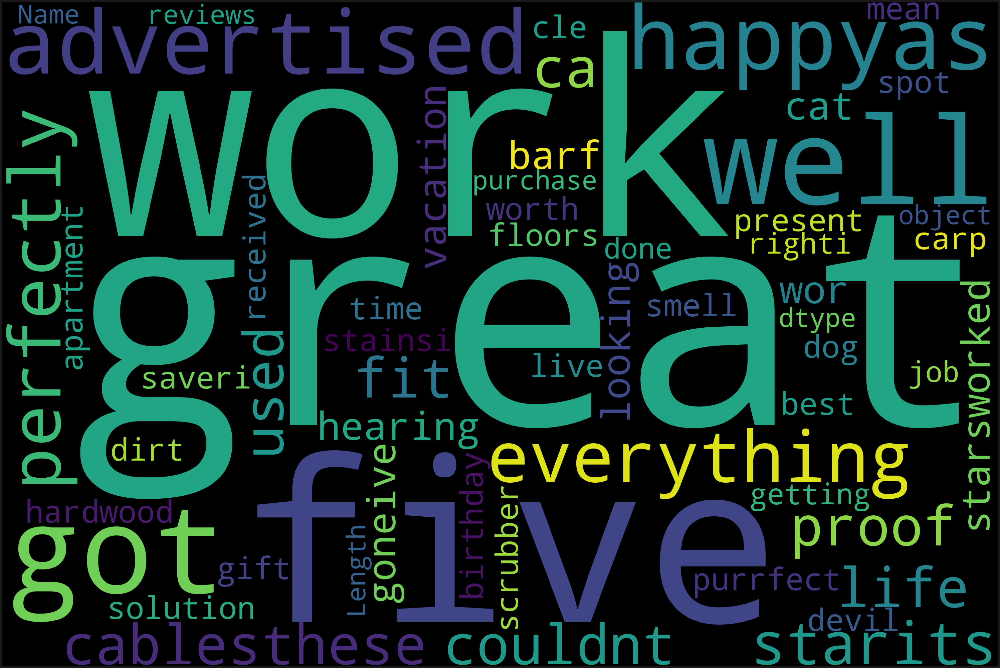

In [55]:
text_1 = positive_review["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text_1))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

NEGATIVE


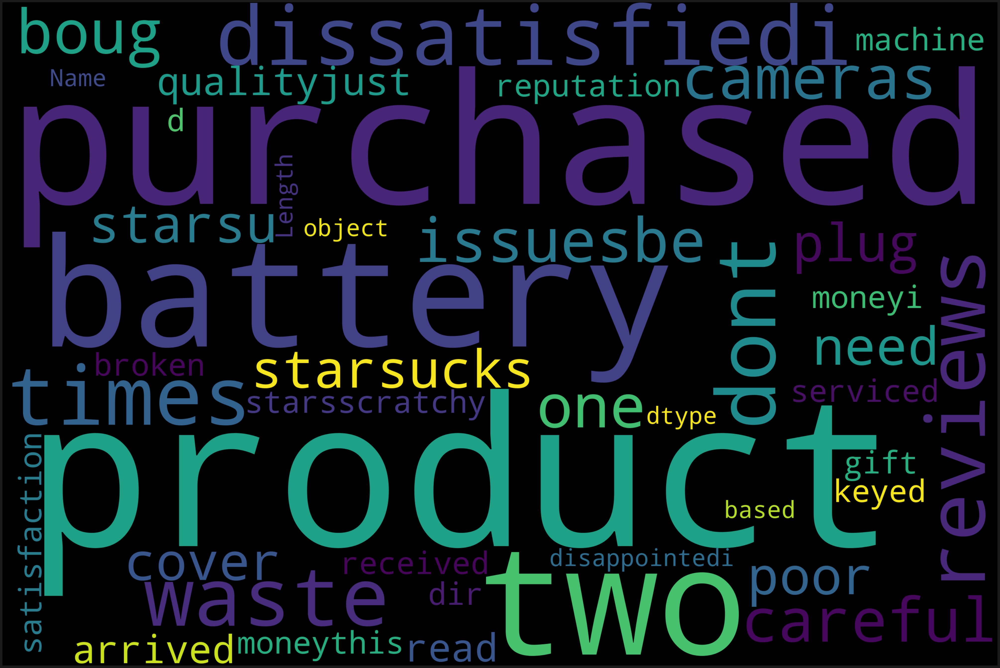

In [56]:
text_2 = negative_review["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text_2))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
print('NEGATIVE')
plt.show()

Neutral


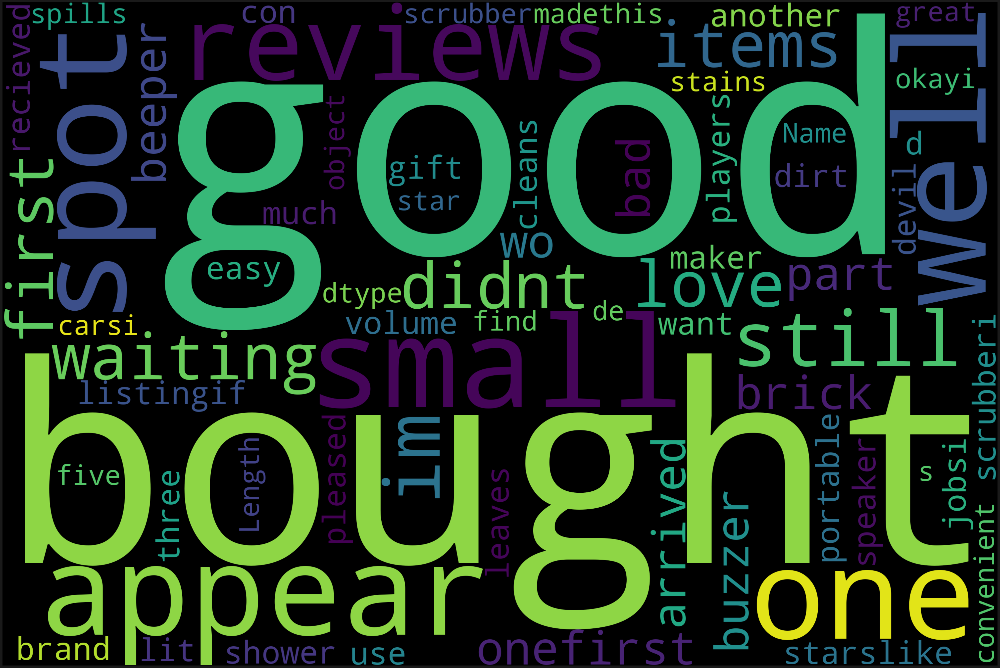

In [57]:
text_3 = neutral_review["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text_3))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
print('Neutral')
plt.show()


In [58]:
# calling the label encoder function
le = preprocessing.LabelEncoder()

# Encode labels in column 'sentiment'.
data['sentiment']= le.fit_transform(data['sentiment'])

data['sentiment'].unique()


array([2, 0, 1])

In [59]:
data['sentiment'].value_counts()

2    70333
0    24894
1     9731
Name: sentiment, dtype: int64

In [60]:
#Extracting 'reviews' for processing
review_features = data.copy()
review_features = review_features[['reviews']].reset_index(drop=True)
review_features.head()

,reviews
0,happyas advertised everything works perfectly ...
1,five starits great
2,great cablesthese work great fit life proof ca...
3,work well but couldnt get used not hearing wor...
4,cameras battery issuesbe careful products boug...


# TFIDF(Term Frequency — Inverse Document Frequency)

In [61]:
tfidf_vectorizer = TfidfVectorizer(max_features = 5000, ngram_range = (2,2))
# TF-IDF feature matrix
X = tfidf_vectorizer.fit_transform(review_features['reviews'])
X.shape

(104958, 5000)

In [62]:
#Getting the target variable(encoded)
y = data['sentiment']
y.shape

(104958,)

In [63]:

print(f'Original dataset shape : {Counter(y)}')

smote = SMOTE(random_state = 42)
X_resampled, y_resampled = smote.fit_resample(X, y)

print(f'Resampled dataset shape {Counter(y_resampled)}')

Original dataset shape : Counter({2: 70333, 0: 24894, 1: 9731})
Resampled dataset shape Counter({2: 70333, 0: 70333, 1: 70333})


# **Model Building**

***Train - Test Split***

Using train test split function we are splitting the dataset into 80:20 ratio for train and test set respectively

In [65]:
## Splitting the dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size = 0.2, random_state=0)

In [66]:
def plot_confusion_matrix(cm, classes,
                          normalize = False,
                          title = 'Confusion matrix',
                          cmap = plt.cm.Purples):
    """
    This function prints and plots the confusion matrix.
    """

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    thresh = cm.max() / 2.
    for i in range (cm.shape[0]):
        for j in range (cm.shape[1]):
            plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    

In [67]:
# creating the objects
logreg = LogisticRegression(random_state=0)
dt = DecisionTreeClassifier()
knn = KNeighborsClassifier()
svc = SVC()
nb = BernoulliNB()
rf = RandomForestClassifier()
cv_dict = {0: 'Logistic Regression', 1: 'Decision Tree', 2:'KNN', 3:'SVC', 4:'Naive Bayes', 5: 'Random Forest'}
cv_models = [logreg, dt, knn, svc, nb, rf]


for i,model in enumerate(cv_models):
    print("{} Test Accuracy: {}".format(cv_dict[i],cross_val_score(model, X, y, cv = 10, scoring = 'accuracy').mean()))

Logistic Regression Test Accuracy: 0.817241180469213
Decision Tree Test Accuracy: 0.7450880691226368
KNN Test Accuracy: 0.6852448810554387
SVC Test Accuracy: 0.8160121326647998
Naive Bayes Test Accuracy: 0.7880670564670749
Random Forest Test Accuracy: 0.7924597251231713


In [68]:
param_grid = {'C': np.logspace(-4, 4, 50),
             'penalty':['l1', 'l2']}
clf = GridSearchCV(LogisticRegression(random_state = 0), param_grid, cv = 5, verbose = 0,n_jobs = -1)
best_model = clf.fit(X_train,y_train)
print(best_model.best_estimator_)
print("The mean accuracy of the model is:", best_model.score(X_test,y_test))


LogisticRegression(C=5.428675439323859, random_state=0)
The mean accuracy of the model is: 0.7402843601895734


In [69]:
logreg = LogisticRegression(C = 5.4286, random_state = 0)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.74


# Classification metrics

In [70]:
def plot_confusion_matrix(cm, classes,
                          normalize = False,
                          title = 'Confusion matrix',
                          cmap = plt.cm.Purples):
    """
    This function prints and plots the confusion matrix.
    """

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    thresh = cm.max() / 2.
    for i in range (cm.shape[0]):
        for j in range (cm.shape[1]):
            plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Confusion matrix, without normalization


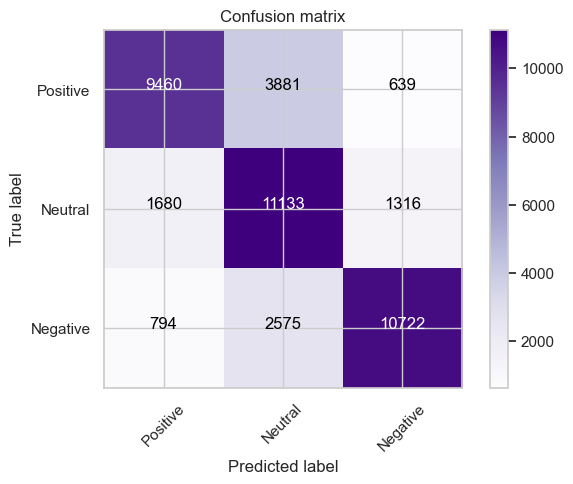

In [71]:
cm = metrics.confusion_matrix(y_test, y_pred)
plot_confusion_matrix(cm, classes = ['Positive','Neutral','Negative'])

In [72]:
print("Classification Report:\n",classification_report(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.68      0.73     13980
           1       0.63      0.79      0.70     14129
           2       0.85      0.76      0.80     14091

    accuracy                           0.74     42200
   macro avg       0.76      0.74      0.74     42200
weighted avg       0.76      0.74      0.74     42200



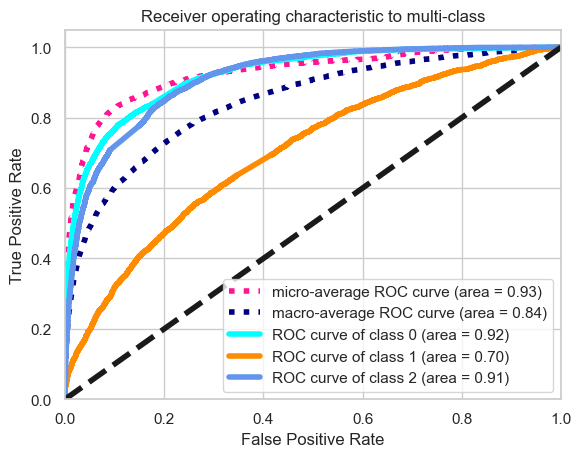

In [78]:
y = label_binarize(y, classes=[0, 1, 2])
n_classes = y.shape[1]

#Train-Test split(80:20)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

#OneVsRestClassifier
classifier = OneVsRestClassifier(svm.SVC(kernel ='linear', probability = True,
                                 random_state=10))
y_score = classifier.fit(X_train, y_train).decision_function(X_test)

#Computing TPR and FPR
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
# aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=4,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw = 4)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic to multi-class')
plt.legend(loc = "lower right")
plt.show()  


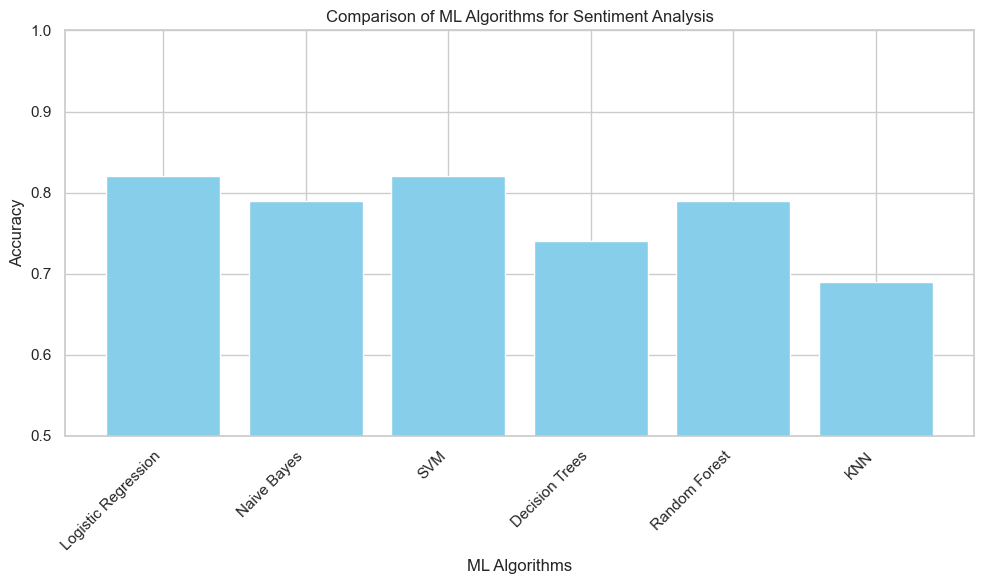

In [74]:
# List of algorithms and their corresponding accuracy scores
algorithms = ["Logistic Regression", "Naive Bayes", "SVM", "Decision Trees", "Random Forest", "KNN"]
accuracy_scores = [0.82, 0.79, 0.82, 0.74, 0.79, 0.69]

# Create a bar chart
plt.figure(figsize=(10, 6))
plt.bar(algorithms, accuracy_scores, color='skyblue')
plt.xlabel("ML Algorithms")
plt.ylabel("Accuracy")
plt.title("Comparison of ML Algorithms for Sentiment Analysis")
plt.ylim(0.5, 1.0)  # Set the y-axis range 
plt.xticks(rotation=45, ha="right")  # Rotate x-axis labels for readability
plt.tight_layout()

# Display the chart
plt.show()
